<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Dataset-description" data-toc-modified-id="Dataset-description-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Dataset description</a></span></li><li><span><a href="#Importing-libraries-and-loading-dataset" data-toc-modified-id="Importing-libraries-and-loading-dataset-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Importing libraries and loading dataset</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>EDA</a></span></li><li><span><a href="#Model-selection" data-toc-modified-id="Model-selection-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Model selection</a></span></li><li><span><a href="#Data-preprocessing" data-toc-modified-id="Data-preprocessing-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Data preprocessing</a></span></li><li><span><a href="#Model-training" data-toc-modified-id="Model-training-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Model training</a></span></li><li><span><a href="#Test-set-prediction" data-toc-modified-id="Test-set-prediction-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Test set prediction</a></span></li></ul></div>

# Introduction


Company Introduction
Your client for this project is a major Avocado Producer.

Their avocados are sourced from over 1000 growers owning over 65,000 acres across California, Mexico, Chile, and Peru.
With generations of experience growing, packing, and shipping avocados, they have a deep understanding of the avocado industry.
Their aim is to source quality fruit that’s sustainably grown and handled in the most efficient, shortest supply route possible.
They want to increase their supply throughout the United States and need to make sure that they are selling their products at the best possible price.

Current Scenario
Avocado prices have rocketed in recent years by up to 129%, with the average national price in the US of a single Hass avocado reaching $2.10 in 2019, almost doubling in just one year.
Due to this uncertainty in the prices, the company is not able to sell their produce at the optimal price.

The current process suffers from the following problems:

The price of avocado is dependent on global demands and seasonal production.
Due to these reasons, it is quite difficult to know for certain the price in the future.

The company has hired you as data science consultants. They want to automate the process of predicting the future price of avocado, based on the historical data.

Your Role
You are given a dataset containing the weekly retail scan data of avocadoes.
Your task is to build a regression model using the dataset.
Because there was no machine learning model for this problem in the company, you don’t have a quantifiable win condition. You need to build the best possible model.

Project Deliverables
Deliverable: Predict the average price of a single avocado.
Machine Learning Task: Regression
Target Variable: AveragePrice
Win Condition: N/A (best possible model)

The dataset contains weekly retail scan data for National Retail Volume (units) and price.

Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados.

The column AveragePrice is the average price of a single avocado.

This is the data that we have to predict for future samples.

# Dataset description

In [ ]:
"" """"
Dataset Feature Description
The Dataset contains the following columns:

Column Name	Description
Id	Unique identity of each observation
Date	The date of the observation
AveragePrice	The average price of a single avocado
Total Volume	Total number of avocados sold.
4046	Total number of avocados with PLU 4046 sold.
4225	Total number of avocados with PLU 4770 sold.
4770	Total number of avocados with PLU 4770 sold.
Total Bags	Total number of bags sold.
Small Bags	Total number of small bags sold.
Large Bags	Total number of large bags sold.
sugarpercent	Total number of extra-large bags sold.
type	Type of an avocado (conventional or organic).
year	The year of observation.
Region	The city or region of the observation.
""""""

# Importing libraries and loading dataset

In [9]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis) 
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high      
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity      
pd.set_option('display.max_rows', None)                            # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
from scipy.stats import randint as sp_randint                       # for initializing random integer values
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
from matplotlib.pylab import rcParams                               # Backend used for rendering and GUI integration                                               
import seaborn as sns                                               # Importin seaborm library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.metrics import accuracy_score                          # For calculating the accuracy for the model
from sklearn.metrics import precision_score                         # For calculating the Precision of the model
from sklearn.metrics import recall_score                            # For calculating the recall of the model
from sklearn.metrics import precision_recall_curve                  # For precision and recall metric estimation
from sklearn.metrics import confusion_matrix                        # For verifying model performance using confusion matrix
from sklearn.metrics import f1_score                                # For Checking the F1-Score of our model  
from sklearn.metrics import roc_curve                               # For Roc-Auc metric estimation
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.model_selection import train_test_split                # To split the data in training and testing part     
from sklearn.ensemble import RandomForestClassifier                 # To create the RandomForest Model
from sklearn.model_selection import RandomizedSearchCV              # to create a RandomSearched hyper-tuned model

#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

In [10]:
df=pd.read_csv('avocado_train.csv')

# EDA

In [ ]:
df.head()

,Id,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,14761,2017-08-20,1.86000,2584.08000,61.21000,143.82000,0.00000,2379.05000,2379.05000,0.00000,0.00000,organic,2017,Albany
1,6843,2017-11-12,1.14000,100811.00000,3181.00000,43510.00000,86.00000,54034.00000,11788.00000,42246.00000,0.00000,conventional,2017,Louisville
2,7306,2017-02-12,0.95000,430096.94000,242212.80000,81697.52000,264.25000,105922.37000,48557.37000,57365.00000,0.00000,conventional,2017,Orlando
3,12329,2016-05-22,1.71000,5433.16000,437.48000,2422.71000,544.63000,2028.34000,2021.67000,6.67000,0.00000,organic,2016,Charlotte
4,12036,2016-01-10,1.66000,5614.09000,2123.47000,2121.26000,0.00000,1369.36000,392.02000,977.34000,0.00000,organic,2016,Atlanta


In [ ]:
df.shape

(14599, 14)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14599 entries, 0 to 14598
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Id            14599 non-null  int64  
 1   Date          14599 non-null  object 
 2   AveragePrice  14599 non-null  float64
 3   Total Volume  14599 non-null  float64
 4   4046          14599 non-null  float64
 5   4225          14599 non-null  float64
 6   4770          14599 non-null  float64
 7   Total Bags    14599 non-null  float64
 8   Small Bags    14599 non-null  float64
 9   Large Bags    14599 non-null  float64
 10  XLarge Bags   14599 non-null  float64
 11  type          14599 non-null  object 
 12  year          14599 non-null  int64  
 13  region        14599 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.6+ MB


In [ ]:
df.describe()

,Id,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000,14599.00000
mean,9116.12090,1.40917,813661.38208,278761.62760,283515.65090,21755.64303,229626.44096,174635.36528,51995.45303,2995.62224,2016.14617
std,5279.98990,0.40452,3292013.05240,1206792.16214,1150214.74644,102560.78581,942977.45607,713921.22210,234344.10351,17313.44516,0.93757
min,2.00000,0.44000,385.55000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2015.00000
25%,4538.50000,1.10000,10808.23000,849.36000,3018.25500,0.00000,5040.90000,2828.89000,131.45500,0.00000,2015.00000
50%,9125.00000,1.37000,107018.62000,8425.39000,28907.47000,180.72000,39602.96000,26311.76000,2621.75000,0.00000,2016.00000
75%,13698.50000,1.67000,426170.21000,108782.22000,145160.54500,6136.66500,109645.32500,83000.46500,21511.12000,127.94000,2017.00000
max,18249.00000,3.25000,62505646.52000,21620180.90000,20470572.61000,2546439.11000,19373134.37000,13384586.80000,5719096.61000,551693.65000,2018.00000


In [3]:
df.isnull().sum()

Id              0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [4]:
zero=(df==0).sum()
zero

Id                 0
Date               0
AveragePrice       0
Total Volume       0
4046             192
4225              45
4770            4370
Total Bags        13
Small Bags       129
Large Bags      1871
XLarge Bags     9649
type               0
year               0
region             0
dtype: int64

In [ ]:
import pandas_profiling as pp
profile = pp.ProfileReport(df, title = "EDA")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

     |████████████████████████████████| 51kB 4.0MB/s 
Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (14599, 14)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  2
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    13 Predictors classified...
        This does not include the Target column(s)
        3 variables removed since they were ID or low-information variables
    List of variables removed: ['Id', 'Date', 'region']

################ Regression VISUALIZATION Started #####################
Data Set Shape: 14599 rows, 11 cols
Data Set columns info:
* Total Volume: 0 nulls, 14592 unique vals, most co

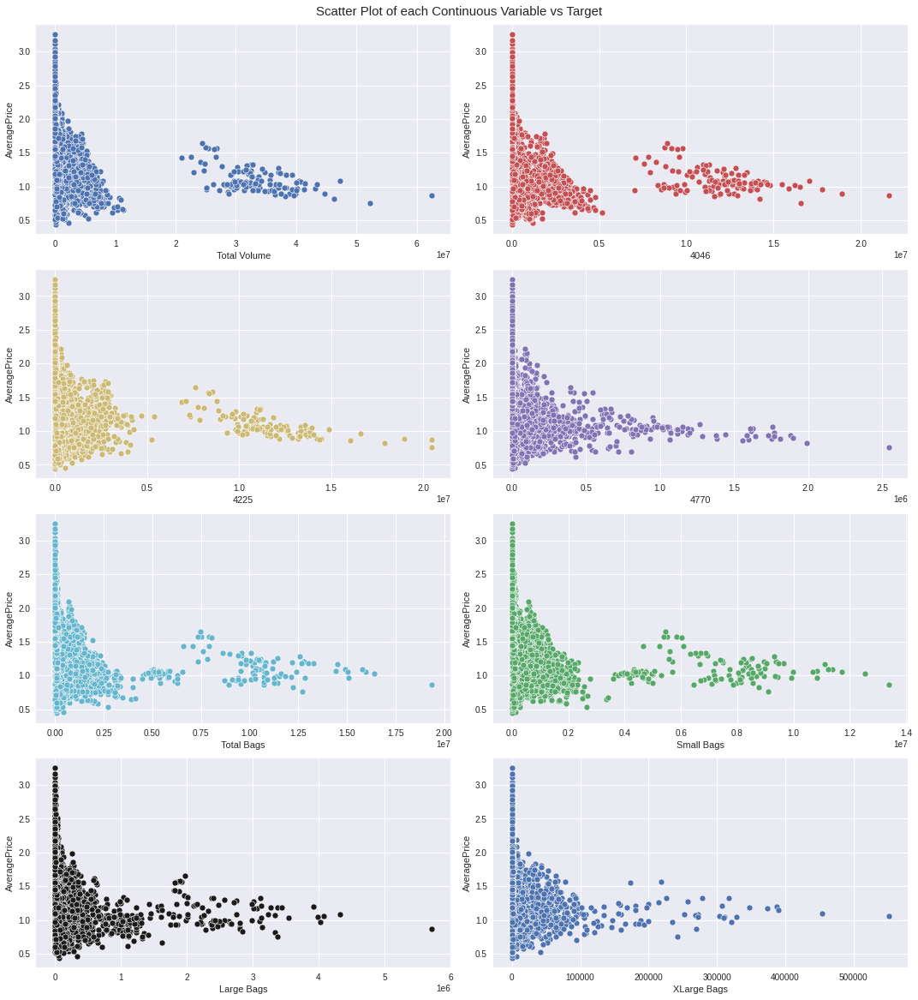

Number of All Scatter Plots = 36


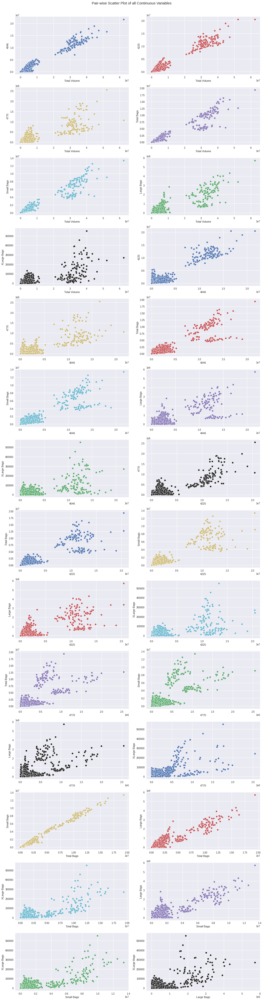

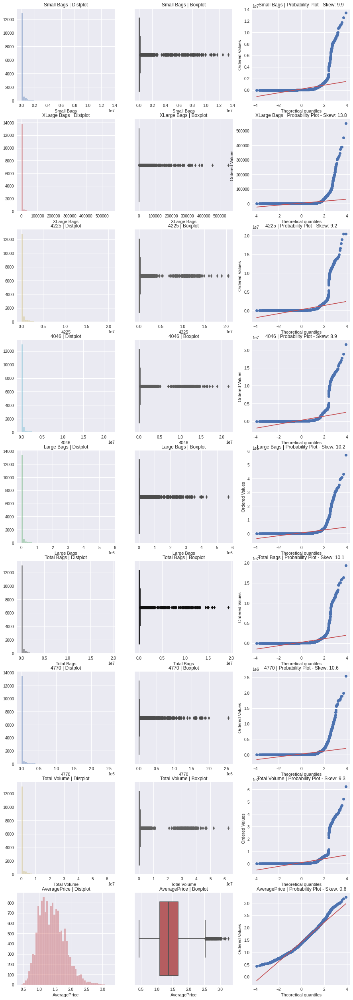

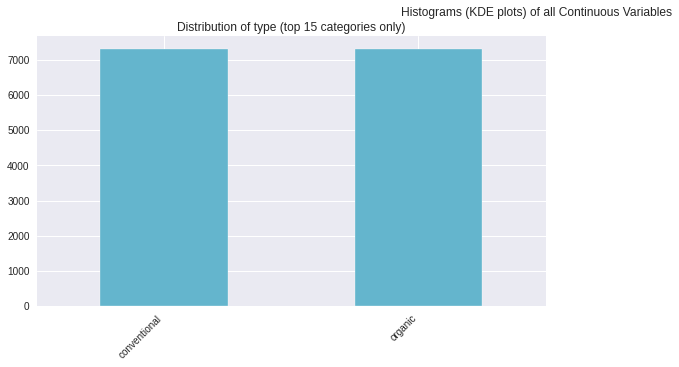

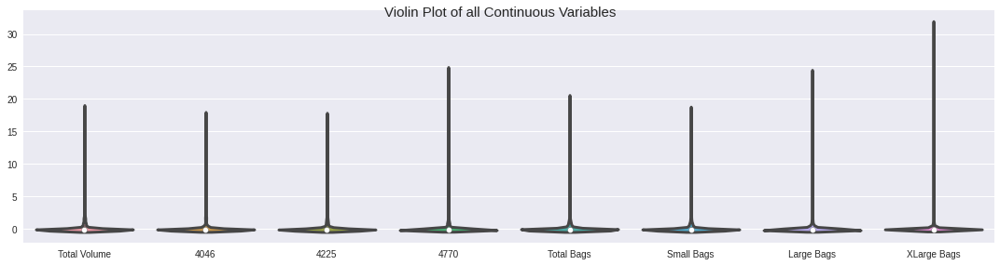

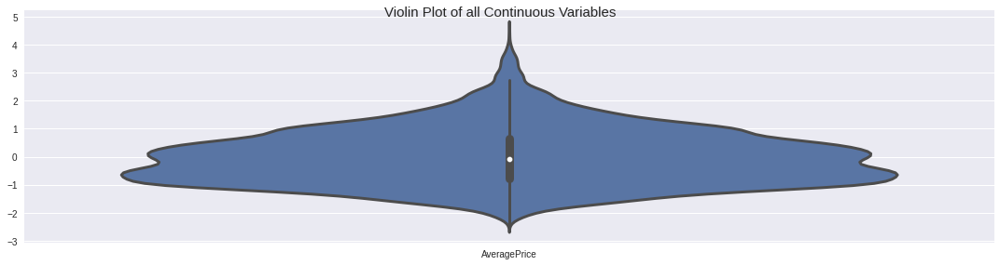

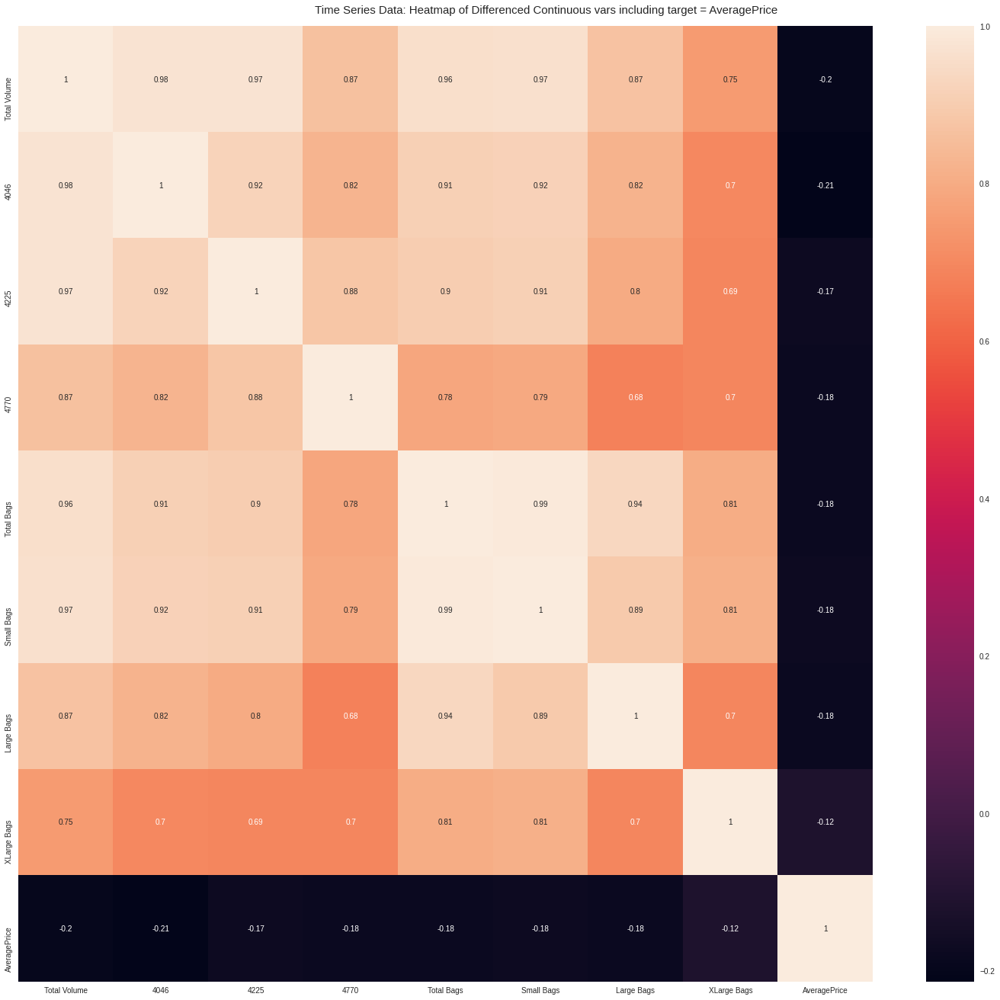

Could not draw Time Series plots


<Figure size 1080x1152 with 0 Axes>

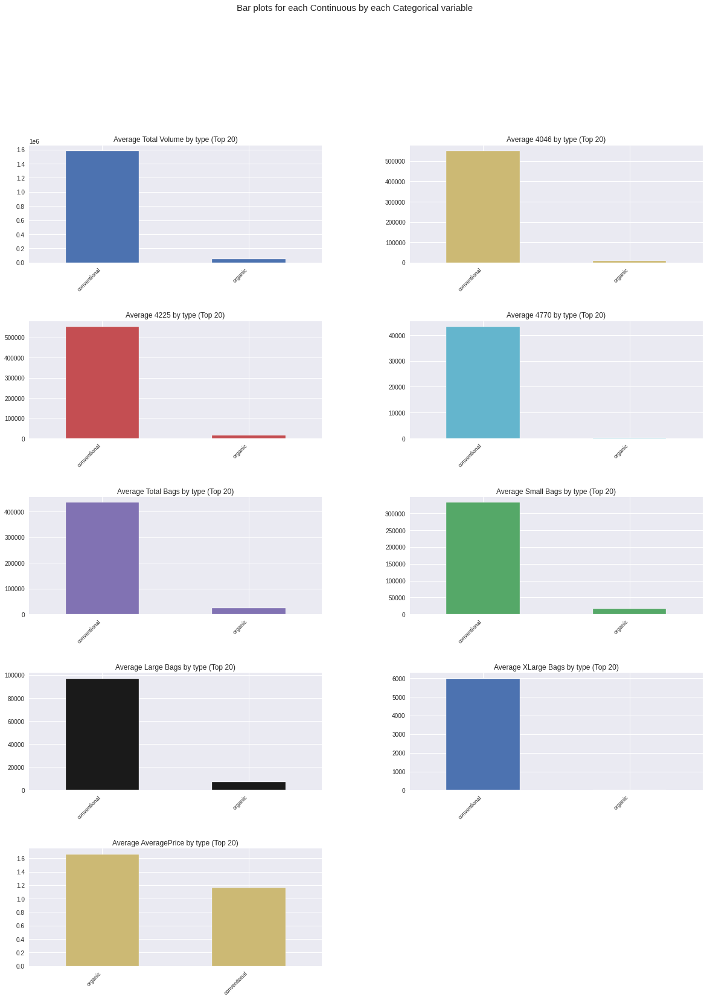

All Plots done
Time to run AutoViz (in seconds) = 28.185

 ###################### VISUALIZATION Completed ########################


In [ ]:
viz = AV.AutoViz(filename="",sep=',', depVar='AveragePrice', dfte=df, header=0, verbose=1, 
                 lowess=False, chart_format='svg')

In [ ]:
import dtale
import dtale.app as dtale_app

dtale_app.USE_COLAB = True

dtale.show(df)

https://ltzdpa90u7n-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/3

In [7]:
import sweetviz
report = sweetviz.analyze([df, "avocado_train"], 
target_feat='AveragePrice')

                                             |          | [  0%]   00:00 -> (? left)


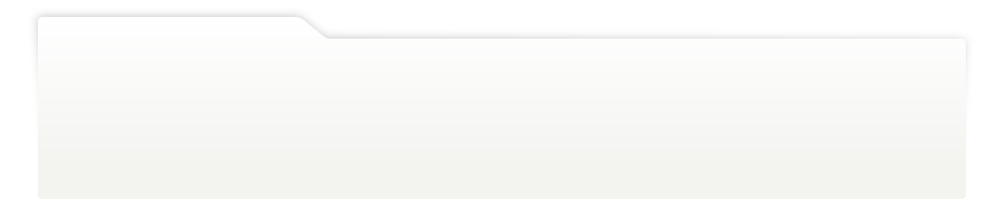
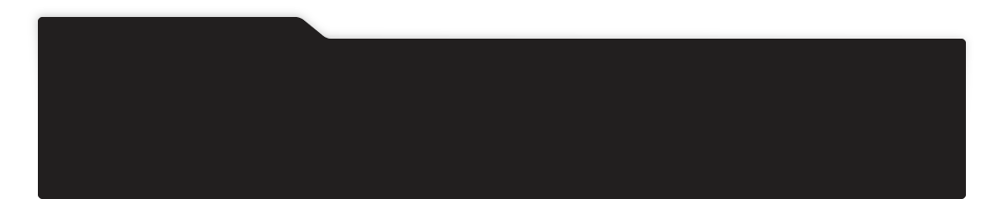
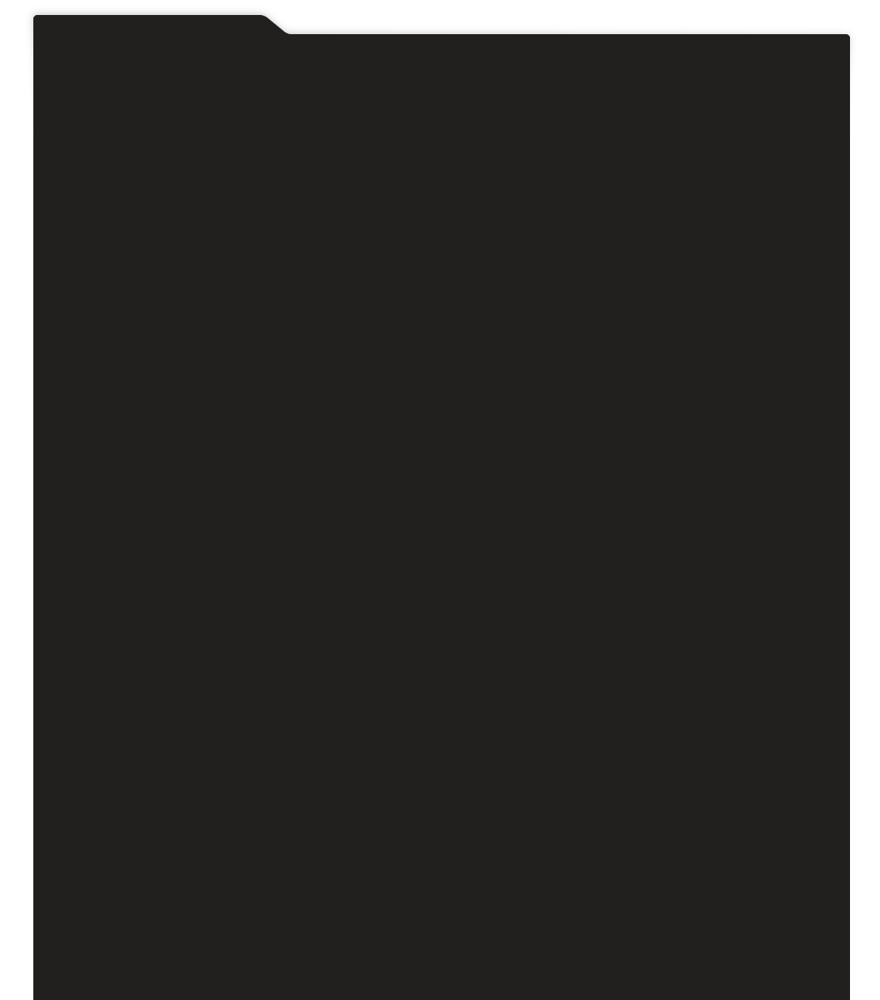
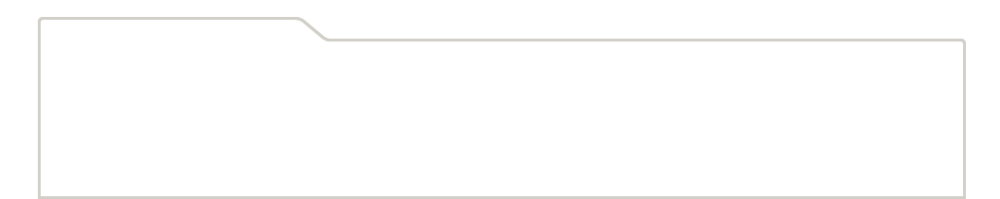
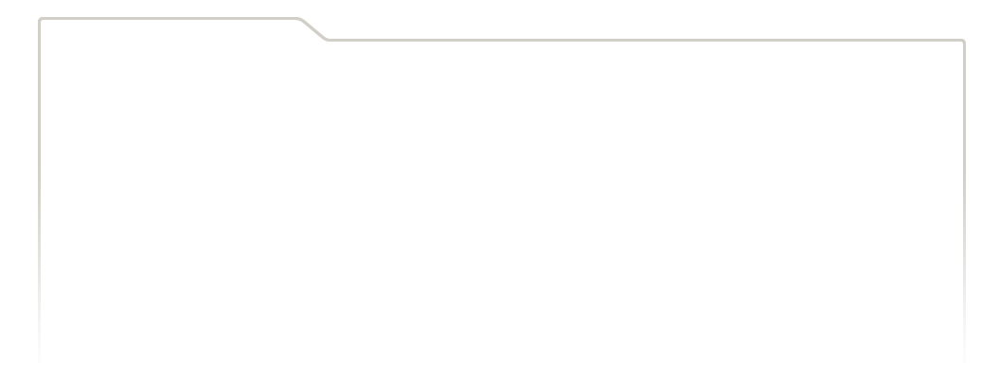
...
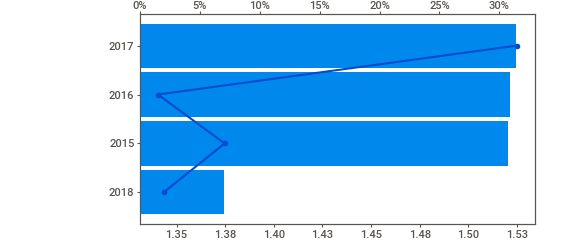
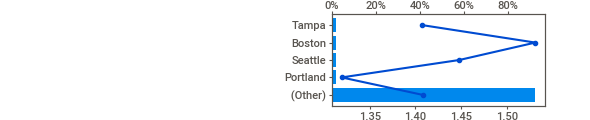
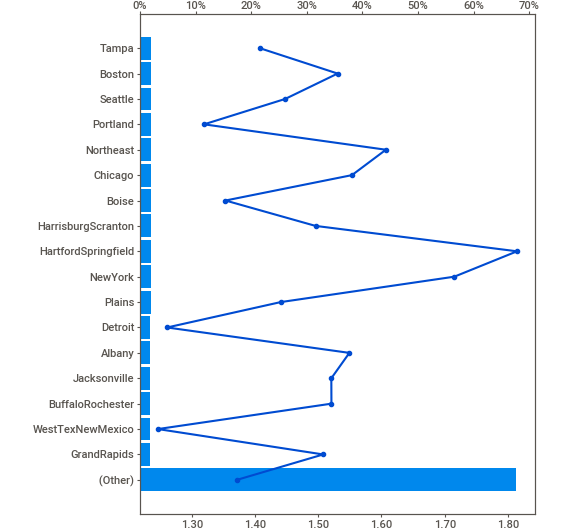
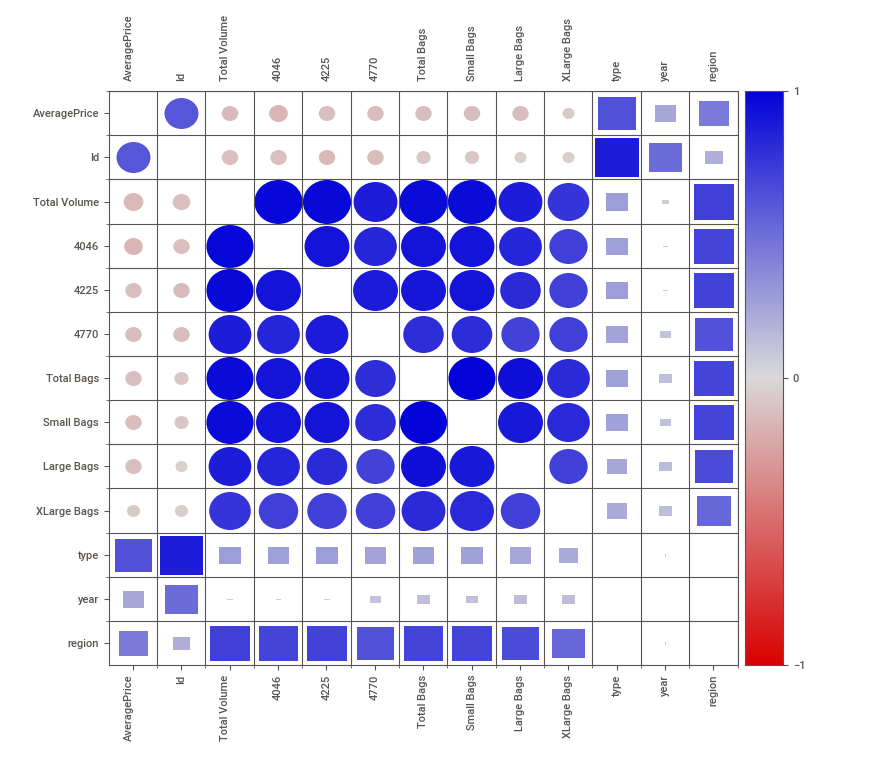
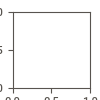

In [8]:
report.show_notebook()

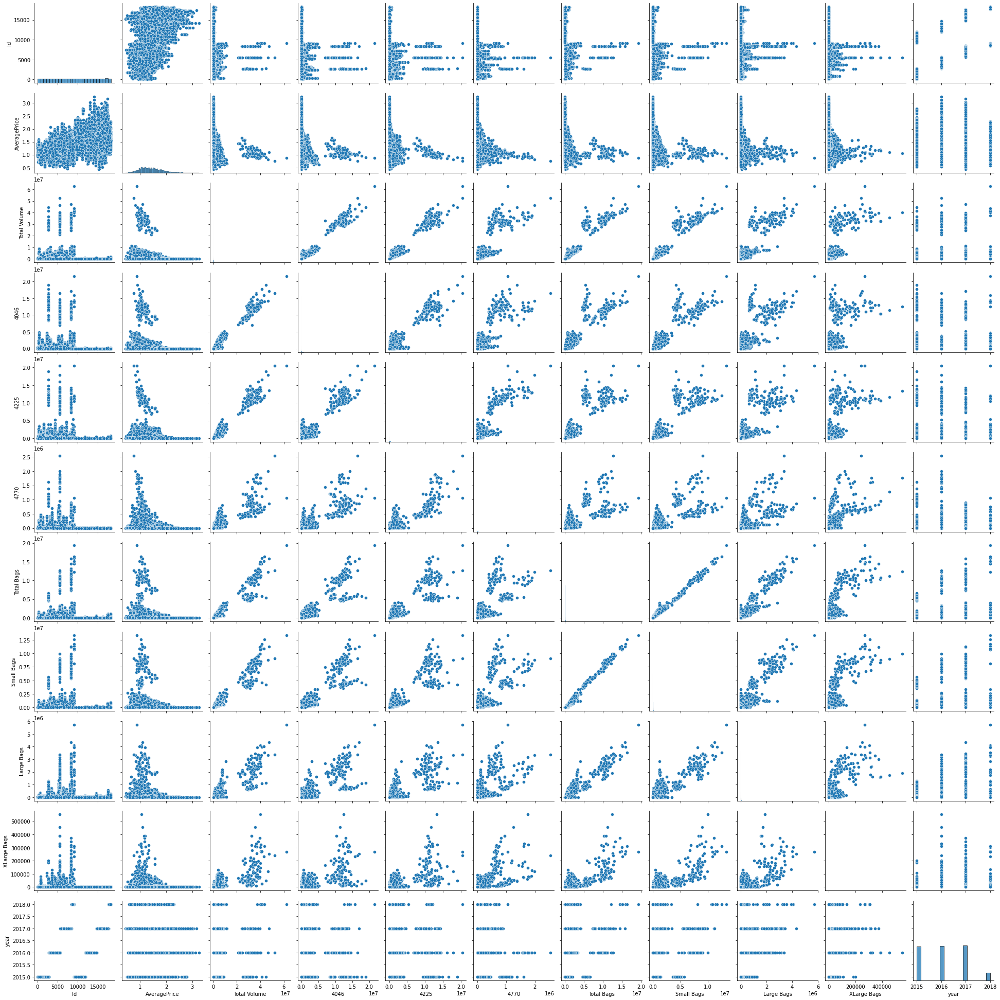

In [3]:
sns.pairplot(df)

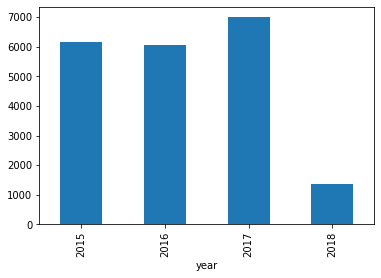

In [20]:
df.groupby([df.year])['AveragePrice'].sum().plot.bar()

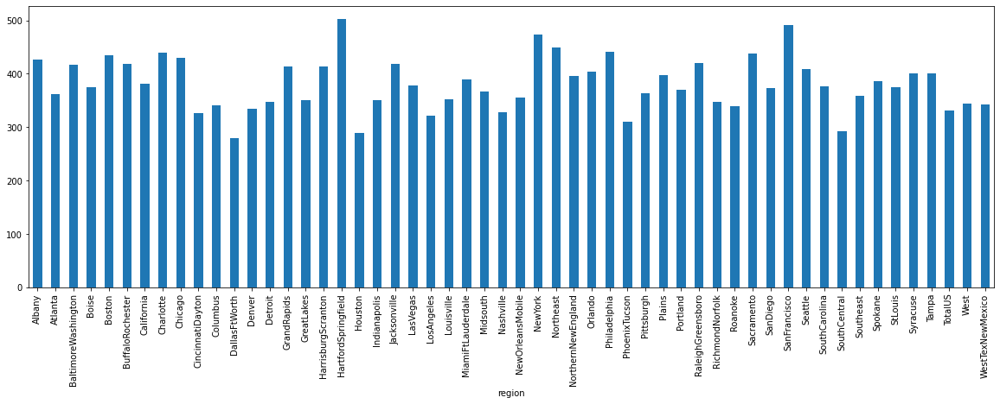

In [19]:
plt.figure(figsize=(20,6))
df.groupby([df.region])['AveragePrice'].sum().plot.bar()

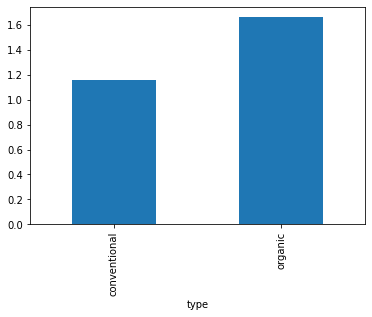

In [7]:
df.groupby([df['type']])['AveragePrice'].mean().plot.bar()

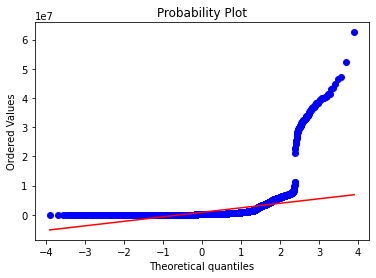

In [3]:
import pylab 
import scipy.stats as stats
stats.probplot(df['Total Volume'], dist="norm", plot=pylab)
pylab.show()

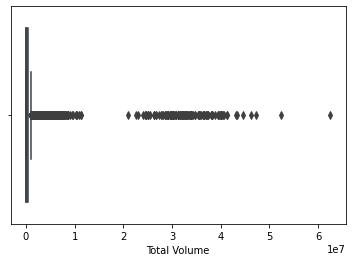

In [8]:
sns.boxplot(df['Total Volume'])

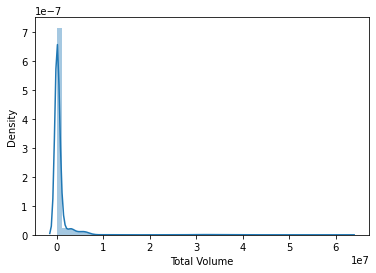

In [3]:
sns.distplot(df['Total Volume'])

In [4]:
df['Total Volume']=np.log1p(df['Total Volume'])

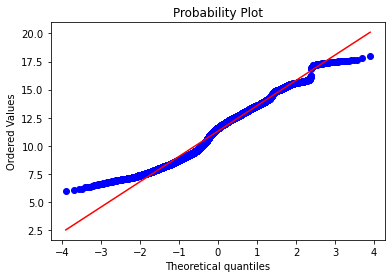

In [5]:
import pylab 
import scipy.stats as stats
stats.probplot(df['Total Volume'], dist="norm", plot=pylab)
pylab.show()

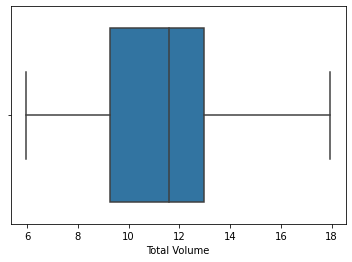

In [11]:
sns.boxplot(df['Total Volume'])

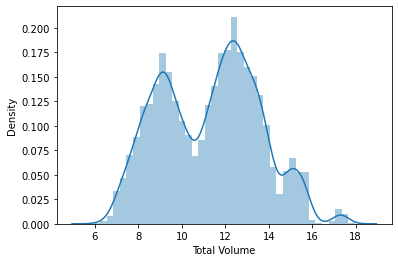

In [12]:
sns.distplot(df['Total Volume'])

# Model selection

In [ ]:
import pycaret
from pycaret.regression import *

In [ ]:
reg = setup(data = df, target = 'AveragePrice')

,Description,Value
0,session_id,1399
1,Target,AveragePrice
2,Original Data,"(14599, 14)"
3,Missing Values,False
4,Numeric Features,9
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(10219, 83)"


In [ ]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.08790,0.01690,0.13000,0.89520,0.05170,0.06460,7.48100
rf,Random Forest Regressor,0.09760,0.01960,0.13990,0.87850,0.05610,0.07230,8.89600
lightgbm,Light Gradient Boosting Machine,0.10660,0.02090,0.14450,0.87040,0.05780,0.07850,0.28000
dt,Decision Tree Regressor,0.13310,0.04080,0.20170,0.74680,0.08090,0.09740,0.17100
gbr,Gradient Boosting Regressor,0.15990,0.04460,0.21100,0.72390,0.08510,0.12040,2.83300
knn,K Neighbors Regressor,0.15740,0.04930,0.22180,0.69440,0.08960,0.11850,0.15800
br,Bayesian Ridge,0.18160,0.05810,0.24080,0.64020,0.09690,0.13610,0.08700
ridge,Ridge Regression,0.20460,0.07220,0.26820,0.55410,0.10840,0.15440,0.05500
ada,AdaBoost Regressor,0.22740,0.07820,0.27960,0.51520,0.11710,0.18360,1.33300
omp,Orthogonal Matching Pursuit,0.21750,0.07920,0.28140,0.50930,0.11520,0.16730,0.03200


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=1546, verbose=0, warm_start=False)

In [ ]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.09120,0.01830,0.13510,0.88510,0.05370,0.06650
1,0.08680,0.01690,0.12990,0.89300,0.05260,0.06500
2,0.08560,0.01610,0.12700,0.90210,0.05100,0.06380
3,0.08630,0.01610,0.12690,0.89390,0.05170,0.06480
4,0.08940,0.01740,0.13170,0.89520,0.05160,0.06370
5,0.08910,0.01760,0.13280,0.89830,0.05160,0.06470
6,0.08510,0.01500,0.12250,0.90710,0.05000,0.06520
7,0.08810,0.01720,0.13110,0.90040,0.05110,0.06290
8,0.08440,0.01490,0.12220,0.91190,0.04840,0.06160
9,0.09200,0.02050,0.14310,0.88570,0.05520,0.06670


In [ ]:
predictions = predict_model(et)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.08580,0.01640,0.12800,0.89680,0.05050,0.06220


# Data preprocessing

In [11]:
df.drop(columns=['Id','region','Date'],inplace=True)

In [12]:
num=['Total Volume','4046','4225','4770','Total Bags','Small Bags','Large Bags','XLarge Bags']

In [13]:
cat=['type','year']

In [14]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[(num)]=scaler.fit_transform(df[(num)])

In [15]:
df.year=df.year.astype(object)

In [16]:
df=pd.get_dummies(df)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14599 entries, 0 to 14598
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   AveragePrice       14599 non-null  float64
 1   Total Volume       14599 non-null  float64
 2   4046               14599 non-null  float64
 3   4225               14599 non-null  float64
 4   4770               14599 non-null  float64
 5   Total Bags         14599 non-null  float64
 6   Small Bags         14599 non-null  float64
 7   Large Bags         14599 non-null  float64
 8   XLarge Bags        14599 non-null  float64
 9   type_conventional  14599 non-null  uint8  
 10  type_organic       14599 non-null  uint8  
 11  year_2015          14599 non-null  uint8  
 12  year_2016          14599 non-null  uint8  
 13  year_2017          14599 non-null  uint8  
 14  year_2018          14599 non-null  uint8  
dtypes: float64(9), uint8(6)
memory usage: 1.1 MB


In [11]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type_conventional,type_organic,year_2015,year_2016,year_2017,year_2018
0,2017-08-20,1.86000,-0.24639,-0.23095,-0.24637,-0.21213,-0.24100,-0.24129,-0.22188,-0.17303,0,1,0,0,1,0
1,2017-11-12,1.14000,-0.21655,-0.22837,-0.20867,-0.21129,-0.18622,-0.22811,-0.04160,-0.17303,1,0,0,0,1,0
2,2017-02-12,0.95000,-0.11652,-0.03029,-0.17547,-0.20956,-0.13119,-0.17661,0.02291,-0.17303,1,0,0,0,1,0
3,2016-05-22,1.71000,-0.24552,-0.23064,-0.24439,-0.20682,-0.24137,-0.24179,-0.22186,-0.17303,0,1,0,1,0,0
4,2016-01-10,1.66000,-0.24547,-0.22924,-0.24465,-0.21213,-0.24207,-0.24407,-0.21771,-0.17303,0,1,0,1,0,0


# Model training

In [17]:
X = df.drop(columns=['AveragePrice'], axis=1)
y = df['AveragePrice']

In [18]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
def train(model, X, y):
    # train the model
    x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=42)
    model.fit(x_train, y_train)
    
    # predict the training set
    pred = model.predict(x_test)
    
    # perform cross-validation
    cv_score = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=5)
    cv_score = np.abs(np.mean(cv_score))
    
    print("Model Report")
    print("RMSE:",np.sqrt(mean_squared_error(y_test, pred)))
    print('CV Score:', cv_score)

Model Report
RMSE: 0.17168995038444648
CV Score: 0.17043884302924014


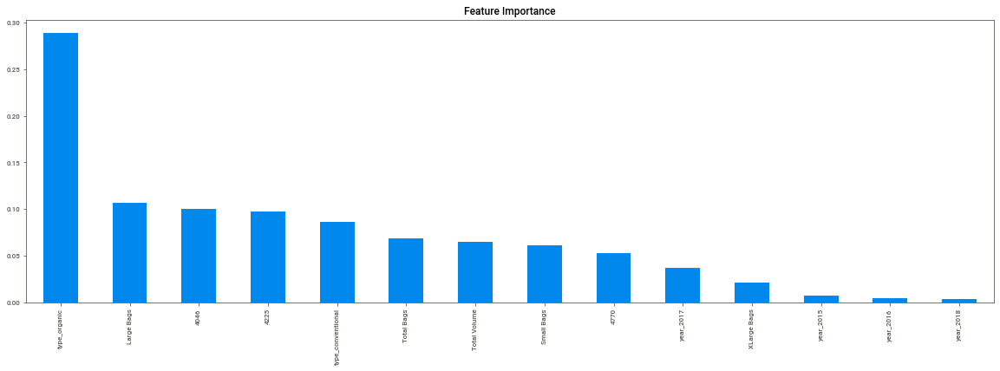

In [19]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
train(model, X, y)
coef = pd.Series(model.feature_importances_, X.columns).sort_values(ascending=False)
plt.figure(figsize=(20,6))
coef.plot(kind='bar', title="Feature Importance")

# Test set prediction

In [12]:
df1=pd.read_csv('avocado_test.csv')

In [13]:
df1.drop(columns=['Id','region','Date'],inplace=True)

In [14]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3650 entries, 0 to 3649
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Total Volume  3650 non-null   float64
 1   4046          3650 non-null   float64
 2   4225          3650 non-null   float64
 3   4770          3650 non-null   float64
 4   Total Bags    3650 non-null   float64
 5   Small Bags    3650 non-null   float64
 6   Large Bags    3650 non-null   float64
 7   XLarge Bags   3650 non-null   float64
 8   type          3650 non-null   object 
 9   year          3650 non-null   int64  
dtypes: float64(8), int64(1), object(1)
memory usage: 285.3+ KB


In [15]:
df1[(num)]=scaler.transform(df1[(num)])

In [17]:
df1.year=df1.year.astype(object)

In [18]:
df1=pd.get_dummies(df1)

In [19]:
df1.head()

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type_conventional,type_organic,year_2015,year_2016,year_2017,year_2018
0,-0.24340,-0.23065,-0.24113,-0.20679,-0.23792,-0.24138,-0.20924,-0.17303,0,1,1,0,0,0
1,-0.24357,-0.22872,-0.24639,-0.21213,-0.23402,-0.23213,-0.22171,-0.17303,0,1,0,0,1,0
2,1.04400,0.38263,0.99151,3.26682,1.59028,1.37690,1.84940,4.80576,1,0,0,0,1,0
3,-0.22440,-0.23015,-0.20896,-0.21172,-0.21096,-0.20467,-0.21258,-0.17303,1,0,0,0,1,0
4,-0.24577,-0.23051,-0.24424,-0.21213,-0.24204,-0.24365,-0.21888,-0.17303,0,1,1,0,0,0


In [21]:
Final_pred = model.predict(df1)

In [22]:
prediction = pd.DataFrame(Final_pred).to_csv('submission.csv')